In [ ]:
import numpy as np
import pandas as pd
import anndata as ad
from scipy.sparse import csr_matrix
import celloracle as co
import os
import sys
import matplotlib.pyplot as plt
import scanpy as sc
import seaborn as sns
import math
from celloracle.applications import Oracle_development_module
from tqdm.notebook import tqdm

plt.rcParams["figure.figsize"] = [6,6]
%config InlineBackend.figure_format = 'retina'
plt.rcParams["savefig.dpi"] = 600
%matplotlib inline

which: no R in (/bgfs/rgottschalk/Sonia/envs/celloracle_new/bin:/usr/local/bin:/usr/bin:/usr/local/sbin:/usr/sbin:/ihome/crc/pipx/bin/:/ihome/rgottschalk/sok65/.local/bin:/ihome/rgottschalk/sok65/bin)
/bgfs/rgottschalk/Sonia/envs/celloracle_new/lib/python3.9/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [2]:
oracle = co.load_hdf5("20251213_GSE280003_MoMRAM.celloracle.oracle")
links = co.load_hdf5("20251111_MoMRAM_GSE280003_chrombpnet.celloracle.links")
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=5, use_cluster_specific_TFdict=True)

  0%|          | 0/8 [00:00<?, ?it/s]

In [3]:
TFs = oracle.active_regulatory_genes
RAM_idx = np.where(oracle.adata.obs["macType"] == 'RAM')[0]
MoM_idx = np.where(oracle.adata.obs["macType"] == 'MoM')[0]
index_dictionary = {'RAM':RAM_idx, 'MoM':MoM_idx}

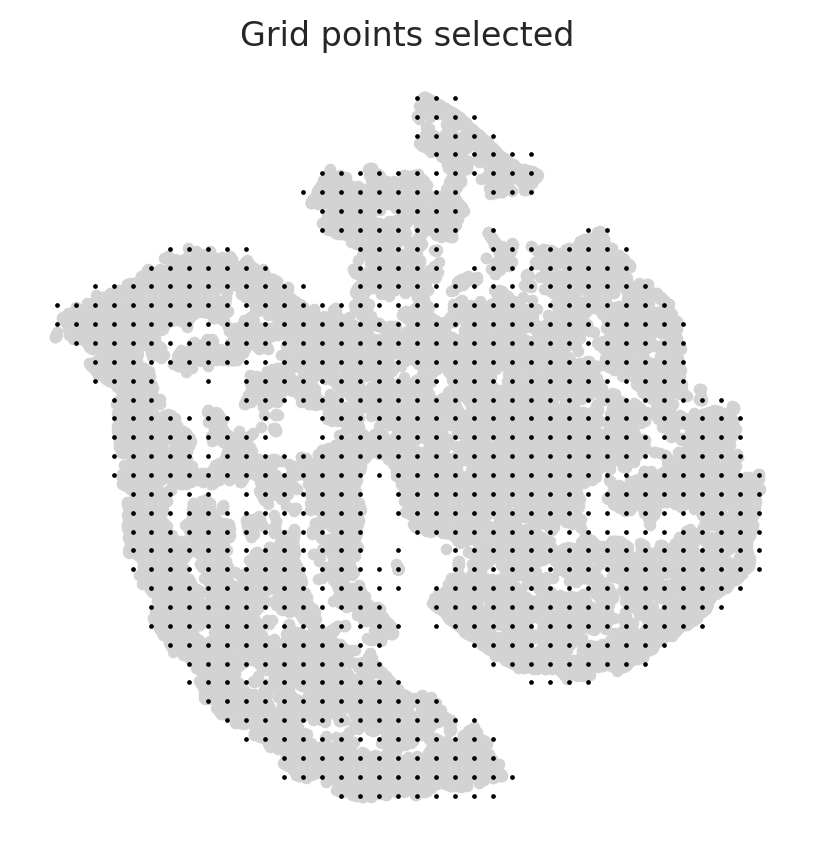

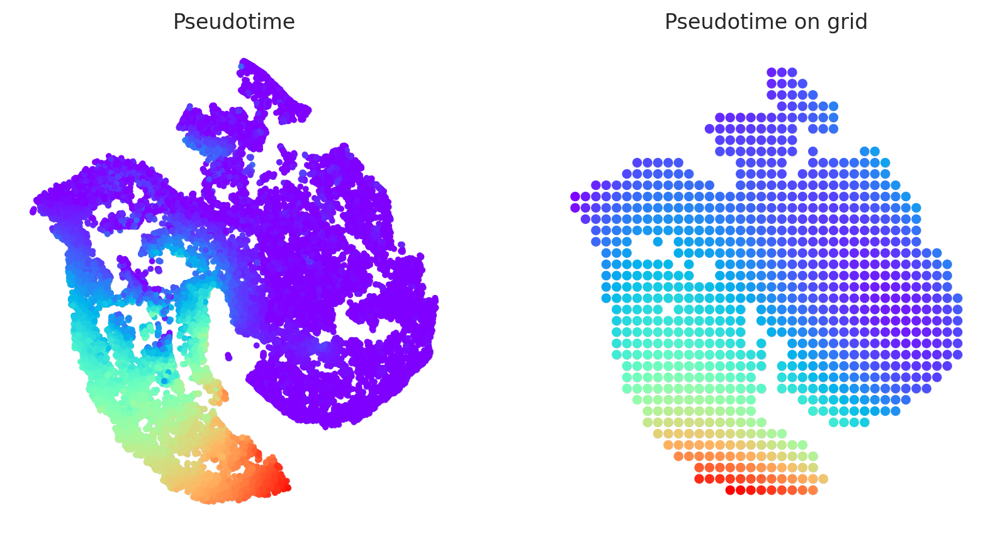

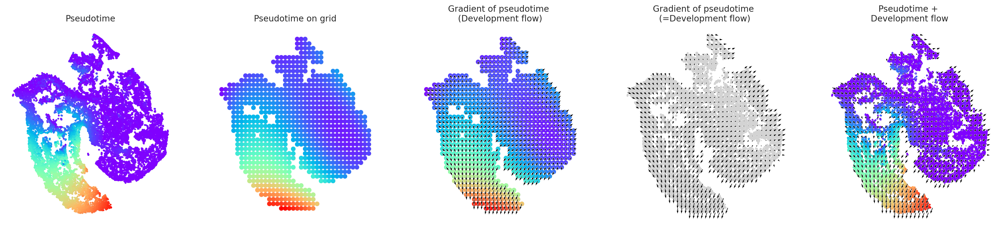

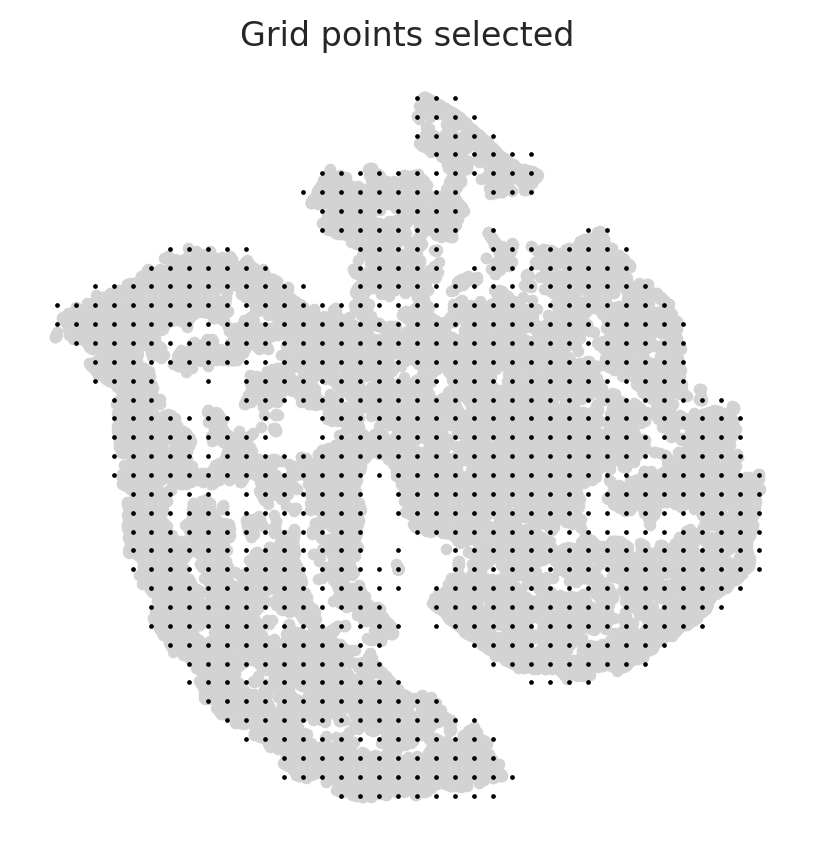

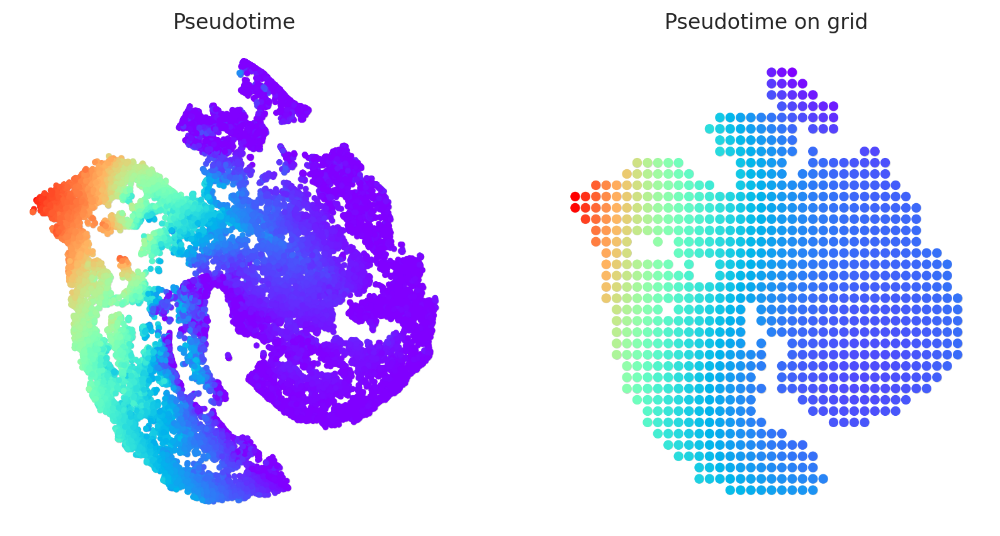

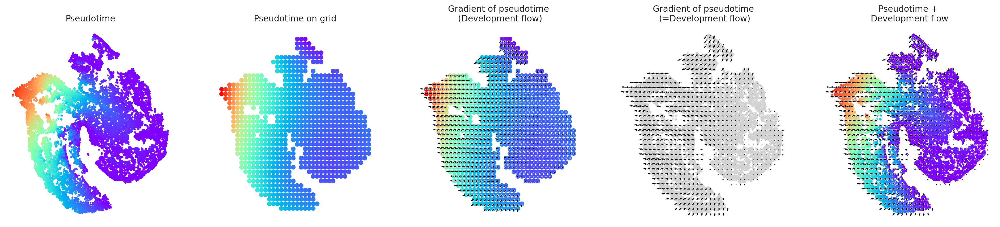

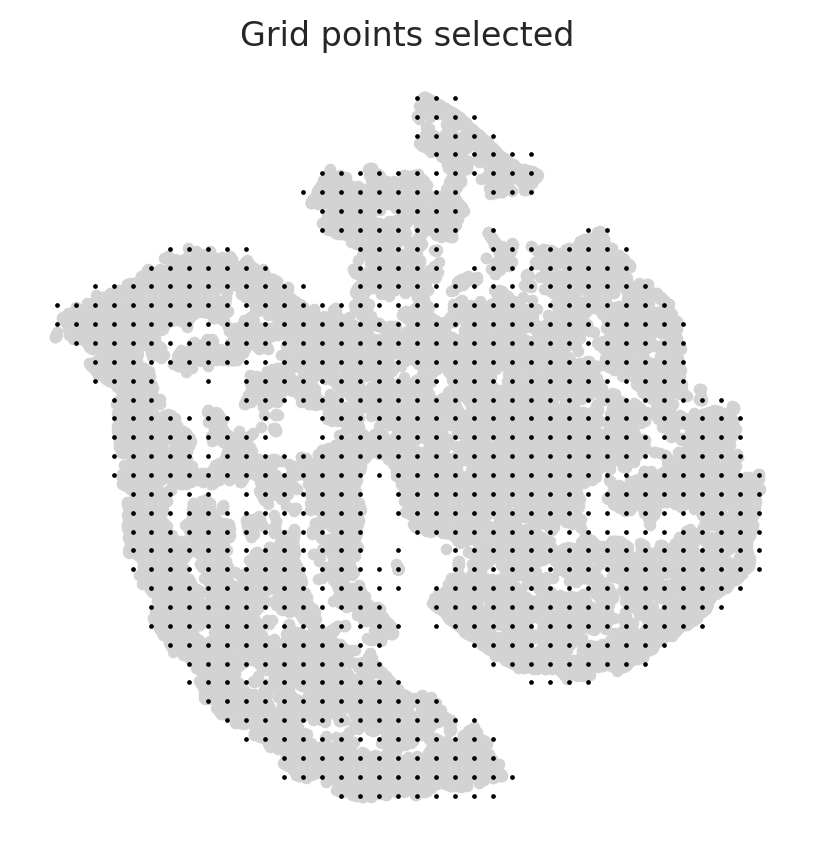

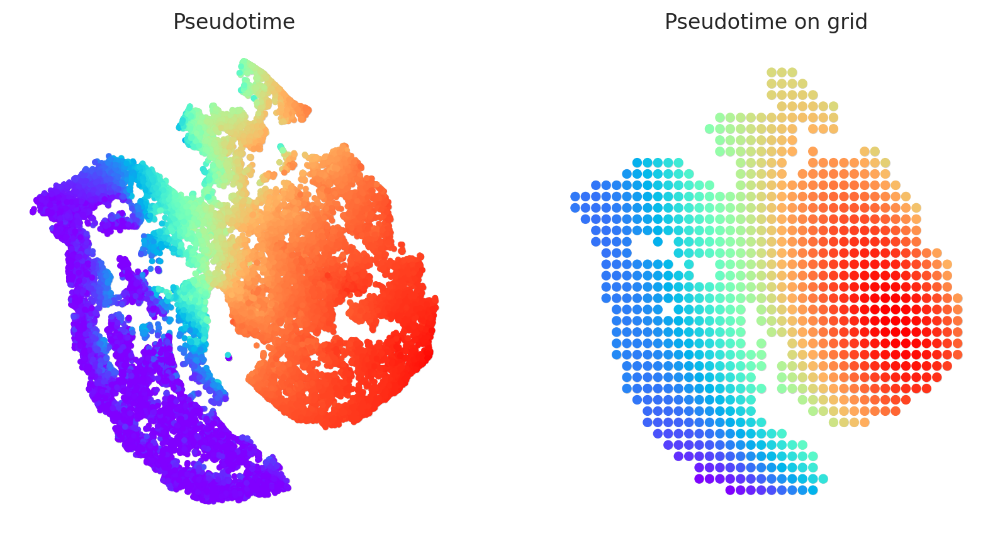

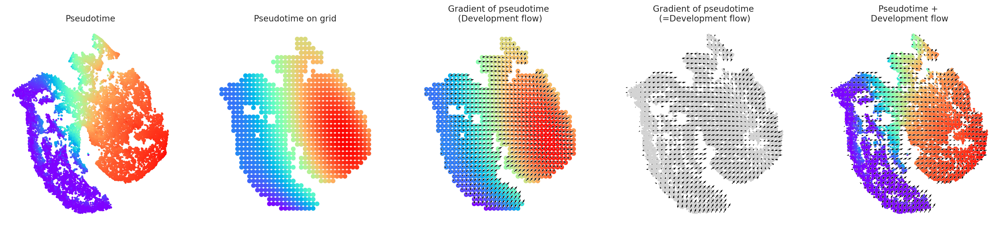

In [4]:
from celloracle.applications import Gradient_calculator

n_grid = 40
min_mass = 9.3
# Instantiate Gradient calculator object
k7gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="k7")
k5gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="k5")
k4gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="k4")
gradients = [k4gradient, k5gradient, k7gradient]

for i, gradient in enumerate(gradients):
    gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
    gradient.calculate_mass_filter(min_mass=min_mass, plot=True)
    gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)
    gradient.calculate_gradient()
    scale_dev = 40
    gradient.visualize_results(scale=scale_dev, s=5)

In [5]:
gradient_dictionary = dict(zip(['k4', 'k5','k7'], gradients))
gradient_dictionary

{'k4': <celloracle.applications.differentiation_flow.Gradient_calculator at 0x7f544cdb1760>,
 'k5': <celloracle.applications.differentiation_flow.Gradient_calculator at 0x7f544cdb1700>,
 'k7': <celloracle.applications.differentiation_flow.Gradient_calculator at 0x7f544cdb1790>}

In [6]:
n_propagation = 3
n_neighbors=200

file_path = "20251213_Systematic_simulation_results_RAM_test.celloracle.hdf5" # Please use .hdf5 for extension.

def pipeline(gene_for_KO, cell_idx):
     
    # 1. Simulate KO
    oracle.simulate_shift(perturb_condition={gene_for_KO: 0},
                                 ignore_warning=True,
                                 n_propagation=3)
    oracle.estimate_transition_prob(n_neighbors=n_neighbors, knn_random=True, sampled_fraction=1)
    oracle.calculate_embedding_shift(sigma_corr=0.05)

    devdata_for_gene = dict()
    
    # Do simulation for all conditions.
    for gradient_name, gradient in gradient_dictionary.items():
        
        dev = Oracle_development_module()
        # Load development flow
        dev.load_differentiation_reference_data(gradient_object=gradient)
        # Load simulation result
        dev.load_perturb_simulation_data(oracle_object=oracle, cell_idx_use=cell_idx, name=gradient_name)
        # Calculate inner product
        dev.calculate_inner_product()
        dev.calculate_digitized_ip(n_bins=10)
        
        # Save results in a hdf5 file.
        dev.set_hdf_path(path=file_path) 
        dev.dump_hdf5(gene=gene_for_KO, misc=gradient_name)

        #hdf_workaround
        #devdata_for_gene[gradient_name] = dev

    return devdata_for_gene
    

In [10]:
# Test pipeline with Gata2 gene
test_list = ['Gata2', 'Spi1']
for gene in test_list:
    pipeline(gene_for_KO=gene, cell_idx = RAM_idx)

2025-12-13 16:37:56,931 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2025-12-13 16:37:56,937 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


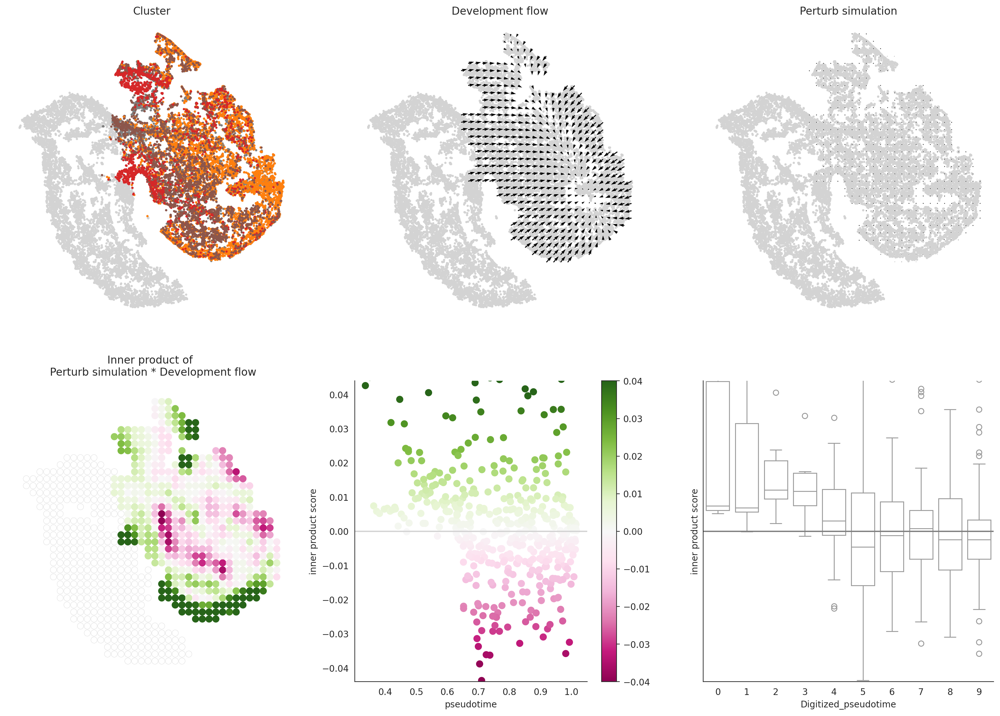

In [18]:
dev_test = Oracle_development_module()

# Read result
dev_test.set_hdf_path(path=file_path)
dev_test.load_hdf5(gene="Gata2", misc="k7")

# Visualize result
dev_test.visualize_development_module_layout_0(s=5, scale_for_simulation=15, s_grid=50,
                                          scale_for_pseudotime=40, vm=0.04)

In [ ]:
TF_list = oracle.active_regulatory_genes
file_path = "20251213_Systematic_simulation_results_RAM.celloracle.hdf5" 
for gene in tqdm(TF_list):
    pipeline(gene_for_KO=gene, cell_idx = RAM_idx)

  0%|          | 0/231 [00:00<?, ?it/s]

No hdf file found in the path. New hdf5 file was created.


In [7]:
#16Dec25
TF_list = oracle.active_regulatory_genes
file_path = "20251216_Systematic_simulation_results_MoM.celloracle.hdf5" 
for gene in tqdm(TF_list):
    pipeline(gene_for_KO=gene, cell_idx = MoM_idx)

  0%|          | 0/231 [00:00<?, ?it/s]

No hdf file found in the path. New hdf5 file was created.
